<a id='Q0'></a>
</a> </center>
<center> <h1> Customer Segmentation </h1> </center>
<p style="margin-bottom:1cm;"></p>
<center><h4>ML Project, 2022, by Marlies Monch and Sibel Yasemin Özgan</h4></center>
<p style="margin-bottom:1cm;"></p>

<div style="background:#EEEDF5;border-top:0.1cm solid #EF475B;border-bottom:0.1cm solid #EF475B;">
    <div style="margin-left: 0.5cm;margin-top: 0.5cm;margin-bottom: 0.5cm;color:#303030">
        <p><strong>Goal:</strong> Short description of the aim of the notebook</p>
        <strong> Outline:</strong>
        <a id='P0' name="P0"></a>
        <ol>
            <li> <a style="color:#303030" href='#I'>Introduction </a> </li>
            <li> <a style="color:#303030" href='#SU'>Set up</a></li>
            <li> <a style="color:#303030" href='#P1'>Part 1</a></li>
            <li> <a style="color:#303030" href='#P2'>Part 2</a></li>
            <li> <a style="color:#303030" href='#P3'>Part 3</a></li>
            <li> <a style="color:#303030" href='#CL'>Conclusion</a></li>
        </ol>
        <strong>Keywords:</strong> data cleaning, NLP, ... list of keywords.
    </div>
</div>
</nav>

<a id='I' name="I"></a>
## [Introduction](#P0)

Here you could write an introduction to the topics. Everything that is written here will appear in the live coding template notebook

<a id='SU' name="SU"></a>
## [Set up](#P0)

### Magics

In [ ]:
# auto reload packages and modules when they are modified
#%load_ext autoreload
#%autoreload 2
# draw matplotlib plots in line
#%matplotlib inline
# enforce PEP 8 code on jupyter lab ...
#%load_ext lab_black
# ... or jupyter notebook
# %load_ext nb_black

### PyCaret

In [52]:
pip install pycaret[full] #==2.3.4

In [53]:
!pip install pyyaml==5.4.1 --ignore-installed

  Using cached PyYAML-5.4.1-cp37-cp37m-manylinux1_x86_64.whl (636 kB)


### Packages

In [43]:
# General
import pandas as pd
import numpy as np

# modelling
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, TfidfVectorizer

# Visualization
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl

from pycaret.clustering import *
#from pycaret.classification import *

import plotly.express as px
import plotly.graph_objects as go

### Custom classes and functions

In [ ]:
import sys
SCRIPT_DIR = "../src"
sys.path.append(SCRIPT_DIR)

In [ ]:
from template_module import my_function_name

ModuleNotFoundError: ignored

### Global Parameters Setting

In [ ]:
plt.style.use("seaborn")

### User-Dependent Variables

<a id='P1'></a>
## [Part one: Exploratory Data Analysis](#P0)

This part is to explore and visualize the data



### Customer Data

This is a subsection. It can either be tagged as a hint, a solution or not tagged.

In [3]:
# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# After executing the cell above, Drive
# files will be present in "/content/drive/My Drive".
!ls "/content/sample_data"

anscombe.json		      mnist_test.csv
california_housing_test.csv   mnist_train_small.csv
california_housing_train.csv  README.md


In [2]:
data = "/content/sample_data/card_transactions.csv"
df = pd.read_csv(data)

df

,customer_id,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc
0,tGEg8fT2eCgVxdwS,9.298409,107.60,0.000000,0.00,0.909091,107.60,0.909091,0.000000,0.818182,0.000000,0,10,1000.0,11,89.868853,89.711672,0.428571
1,stEDu20sSKOXomjg,52.666422,150.30,0.000000,0.00,1.000000,150.30,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,6,54.722514,82.955180,0.000000
2,CEB2blrN3b88GsRe,1360.795674,0.00,462.861443,0.00,1.000000,0.00,0.000000,0.000000,0.000000,0.272727,6,0,1500.0,11,303.031979,443.781316,0.000000
3,0N0eBl8ySaZThxKE,2021.641161,363.18,0.000000,363.18,1.000000,0.00,1.000000,1.000000,0.000000,0.000000,0,13,2000.0,12,704.240770,795.859808,0.000000
4,6NLauoHUwtwOv4Wy,22.322374,95.00,1162.045833,95.00,0.363636,0.00,0.083333,0.083333,0.000000,0.166667,3,1,2500.0,12,4094.261427,40.142262,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8495,zdVfd3CYHYBjf61b,1127.607606,0.00,271.093275,0.00,1.000000,0.00,0.000000,0.000000,0.000000,0.083333,1,0,8500.0,12,662.387331,260.277533,0.000000
8496,JGghMowcxhfbVGKm,21.409828,149.71,0.000000,0.00,1.000000,149.71,0.916667,0.000000,0.916667,0.000000,0,11,1500.0,12,141.974905,150.500248,0.166667
8497,5GrEtC6ncxuLpnXZ,0.000000,0.00,253.887233,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.111111,1,0,500.0,9,2437.932505,NaN,0.000000
8498,Ox7ETtYHjE2uo4Xo,1646.384530,1047.34,146.650389,1047.34,1.000000,0.00,0.583333,0.583333,0.000000,0.166667,2,51,3000.0,12,462.848132,497.408854,0.000000


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   customer_id                       8500 non-null   object 
 1   balance_account                   8500 non-null   float64
 2   purchases_amount                  8500 non-null   float64
 3   paid_advance                      8500 non-null   float64
 4   full_purchases                    8500 non-null   float64
 5   balance_frequency_update          8500 non-null   float64
 6   installments                      8500 non-null   float64
 7   purchases_frequency               8500 non-null   float64
 8   full_purchases_frequency          8500 non-null   float64
 9   purchases_installments_frequency  8500 non-null   float64
 10  cash_advance_frequency            8500 non-null   float64
 11  nr_cash_advances                  8500 non-null   int64  
 12  nr_pur

In [6]:
df.isnull().values.any()

True

<div style="background:#EEEDF5;color:#303030"><div style="margin-left: .2cm">
    <b>Comments:</b>
</div></div>

<div style="margin-left: 0.4cm">
    This Markdown cell is a template to write extended comments. e.g. explain the approach taken, or concepts behind algorithm chosen. Aim at having 2 lines at least. Anything smaller can be directly integrated in the code, or gathered together with other comments to form a bigger paragraph. Since this block is within a div element, you need to use html formatting syntax, not markdown
</div>

<div style="background:#EEEDF5;border:0.1cm solid #FDB100;color:#303030">
    <div style="margin: 0.2cm 0.2cm 0.2cm 0.2cm">
        <b style="color:#FDB100">Title:</b> 
        This is a an example yellow box
    </div>
</div>

<div style="background:#EEEDF5;border:0.1cm solid #00BAE5;color:#303030">
    <div style="margin: 0.2cm 0.2cm 0.2cm 0.2cm">
        <b style="color:#00BAE5">Note:</b>
        This is an example Blue Box
    </div>
</div>

<div style="background:#EEEDF5;border:0.1cm solid #EF475B;color:#303030">
    <div style="margin: 0.2cm 0.2cm 0.2cm 0.2cm">
        <b style="color:#EF475B">Warning:</b> 
        This is an example red box
    </div>
</div>

**Seems as if there are many min_payments values are missing**

*   There is one row in credit_limit so we can drop it
*   Many missing values in min_payments - use imputer



In [4]:
df_clear = df.dropna(subset=['credit_limit'], how='all')
df_clear.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8499 entries, 0 to 8499
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   customer_id                       8499 non-null   object 
 1   balance_account                   8499 non-null   float64
 2   purchases_amount                  8499 non-null   float64
 3   paid_advance                      8499 non-null   float64
 4   full_purchases                    8499 non-null   float64
 5   balance_frequency_update          8499 non-null   float64
 6   installments                      8499 non-null   float64
 7   purchases_frequency               8499 non-null   float64
 8   full_purchases_frequency          8499 non-null   float64
 9   purchases_installments_frequency  8499 non-null   float64
 10  cash_advance_frequency            8499 non-null   float64
 11  nr_cash_advances                  8499 non-null   int64  
 12  nr_pur

In [5]:
df_clear = df_clear.drop(columns= "customer_id", axis=1)

df_clear.head()

,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc
0,9.298409,107.60,0.000000,0.00,0.909091,107.6,0.909091,0.000000,0.818182,0.000000,0,10,1000.0,11,89.868853,89.711672,0.428571
1,52.666422,150.30,0.000000,0.00,1.000000,150.3,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,6,54.722514,82.955180,0.000000
2,1360.795674,0.00,462.861443,0.00,1.000000,0.0,0.000000,0.000000,0.000000,0.272727,6,0,1500.0,11,303.031979,443.781316,0.000000
3,2021.641161,363.18,0.000000,363.18,1.000000,0.0,1.000000,1.000000,0.000000,0.000000,0,13,2000.0,12,704.240770,795.859808,0.000000
4,22.322374,95.00,1162.045833,95.00,0.363636,0.0,0.083333,0.083333,0.000000,0.166667,3,1,2500.0,12,4094.261427,40.142262,0.000000


### Look at correlation

**There are highly correlated features!!**

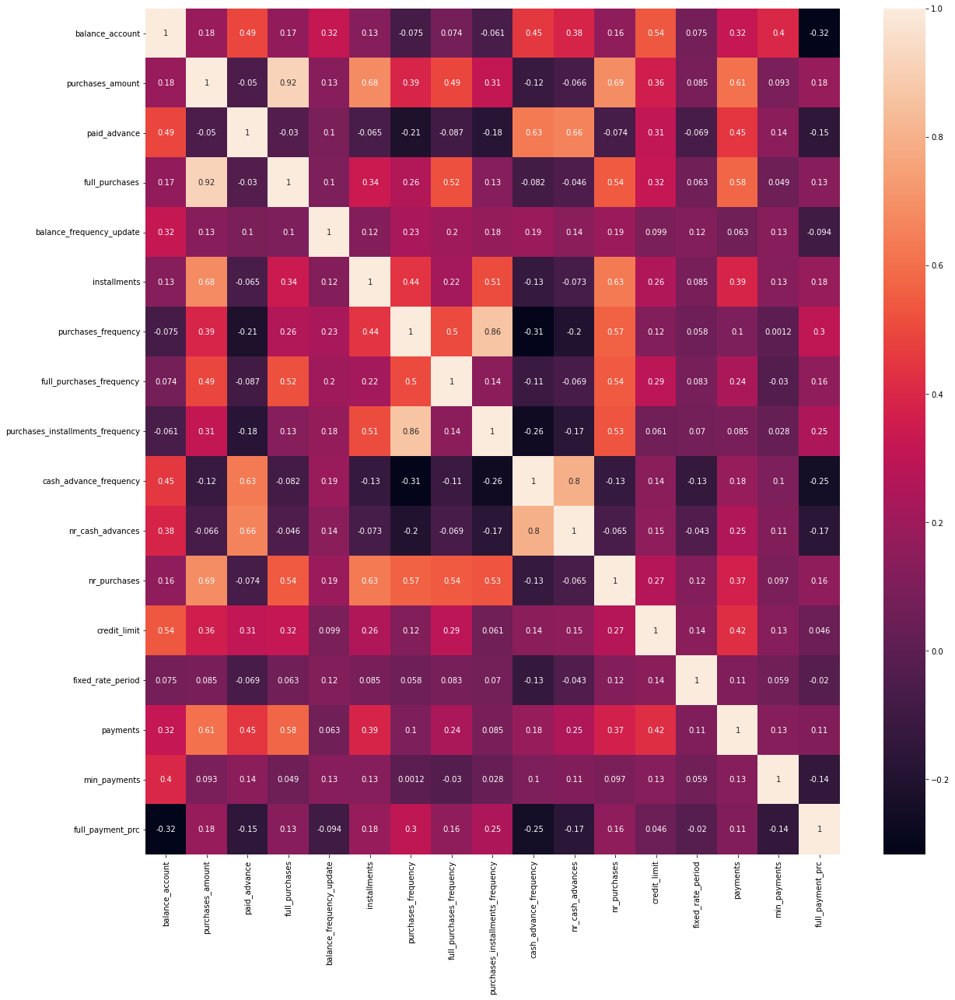

In [ ]:
cor = df_clear.corr()

plt.figure(figsize = (20,20))
sns.heatmap(cor, annot=True)
#sns.set_context("notebook", font_scale=0.5)
#sns.set_context(rc={"font.size":30,"axes.titlesize":30,"axes.labelsize":30, })
#plt.set_xticklabels(fontsize = 12)

plt.show()

<Figure size 720x3600 with 0 Axes>

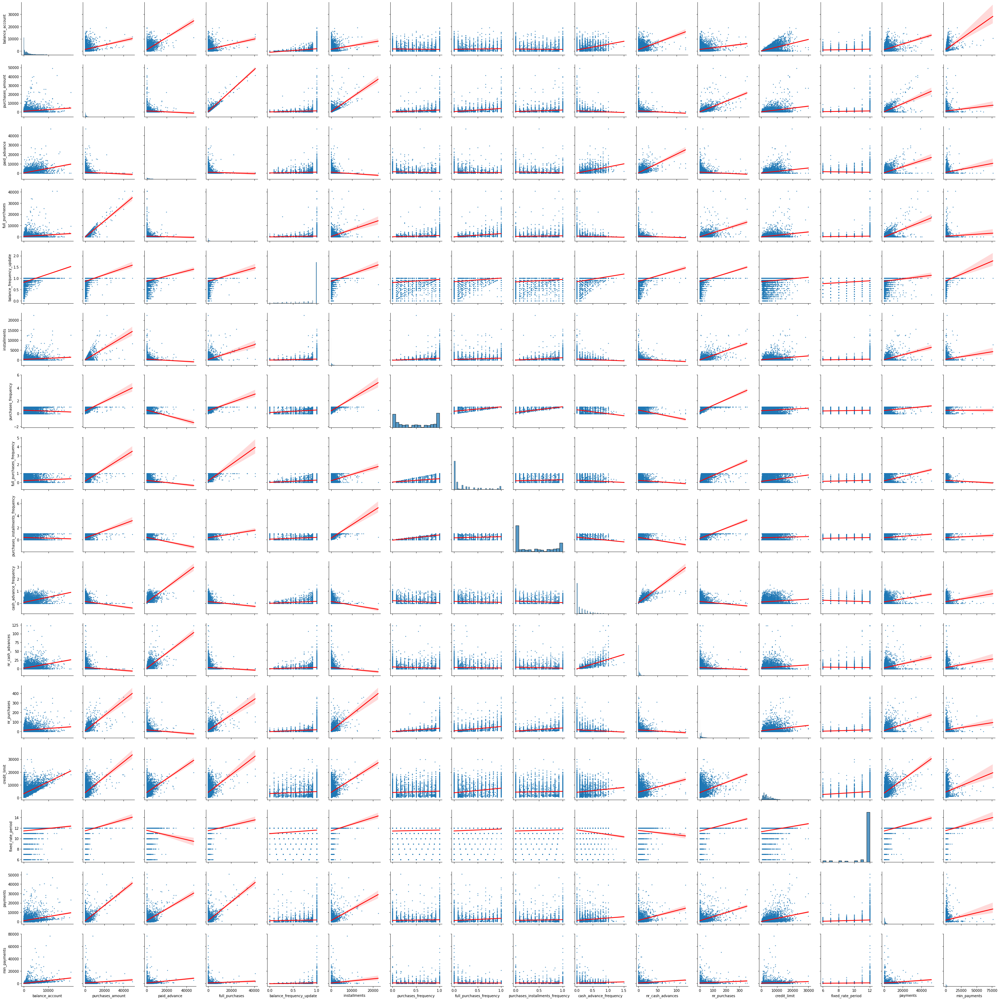

In [ ]:
plt.figure(figsize = (10,50))

plot_kws = {'scatter_kws': {'s': 2}, 'line_kws': {'color': 'red'}}
sns.pairplot(df_clear, kind='reg', vars=df_clear.columns[:-1], plot_kws=plot_kws)
plt.show()

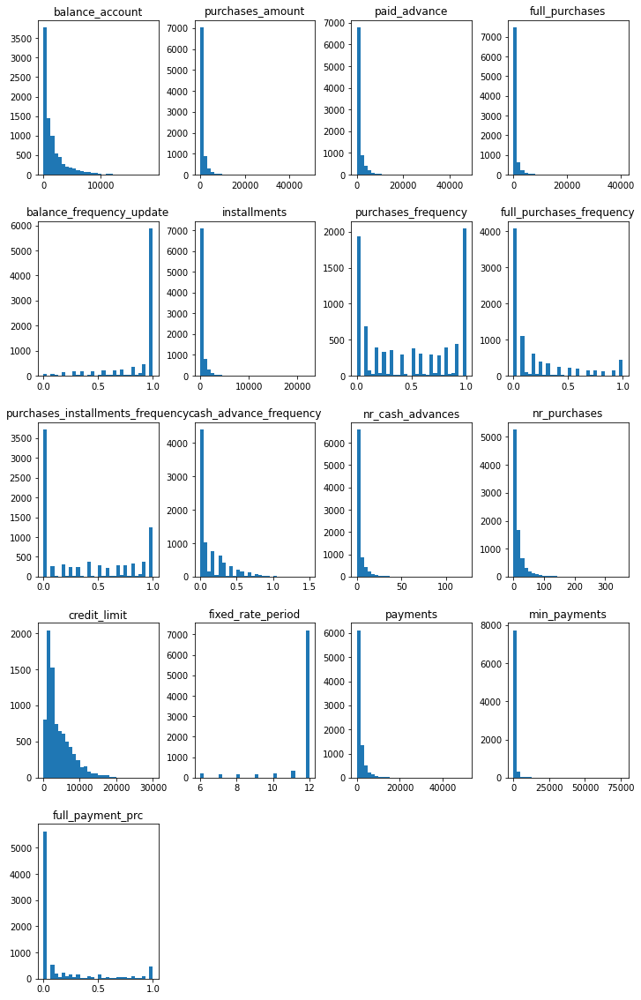

In [ ]:
df_clear.hist(bins = 30, figsize = (12,20), grid = False)
plt.show()

In [48]:
df_clear["fixed_rate_period"].unique()

array([11,  6, 12,  9, 10,  8,  7])

In [6]:
numerics = df_clear.columns.tolist()

In [7]:
numerics

['balance_account',
 'purchases_amount',
 'paid_advance',
 'full_purchases',
 'balance_frequency_update',
 'installments',
 'purchases_frequency',
 'full_purchases_frequency',
 'purchases_installments_frequency',
 'cash_advance_frequency',
 'nr_cash_advances',
 'nr_purchases',
 'credit_limit',
 'fixed_rate_period',
 'payments',
 'min_payments',
 'full_payment_prc']

In [49]:
df_clear.head()

,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc
0,9.298409,107.60,0.000000,0.00,0.909091,107.6,0.909091,0.000000,0.818182,0.000000,0,10,1000.0,11,89.868853,89.711672,0.428571
1,52.666422,150.30,0.000000,0.00,1.000000,150.3,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,6,54.722514,82.955180,0.000000
2,1360.795674,0.00,462.861443,0.00,1.000000,0.0,0.000000,0.000000,0.000000,0.272727,6,0,1500.0,11,303.031979,443.781316,0.000000
3,2021.641161,363.18,0.000000,363.18,1.000000,0.0,1.000000,1.000000,0.000000,0.000000,0,13,2000.0,12,704.240770,795.859808,0.000000
4,22.322374,95.00,1162.045833,95.00,0.363636,0.0,0.083333,0.083333,0.000000,0.166667,3,1,2500.0,12,4094.261427,40.142262,0.000000


## Initialize the PyCaret Environment

In [26]:
"""cluster = setup(df_clear, session_id = 7652,
                numeric_features=numerics,
                normalize=True,
                remove_multicollinearity=True,
                multicollinearity_threshold = 0.8
                )"""

'cluster = setup(df_clear, session_id = 7652,\n                numeric_features=numerics,\n                normalize=True,\n                remove_multicollinearity=True,\n                multicollinearity_threshold = 0.8\n                )'

In [16]:
cluster = setup(df_clear, session_id = 7652)

,Description,Value
0,session_id,7652
1,Original Data,"(8499, 17)"
2,Missing Values,True
3,Numeric Features,16
4,Categorical Features,1
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(8499, 23)"
9,CPU Jobs,-1


In [71]:
model

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=7652, tol=0.0001, verbose=0)

In [72]:
model.get_params()

{'algorithm': 'auto',
 'copy_x': True,
 'init': 'k-means++',
 'max_iter': 300,
 'n_clusters': 5,
 'n_init': 10,
 'n_jobs': -1,
 'precompute_distances': 'deprecated',
 'random_state': 7652,
 'tol': 0.0001,
 'verbose': 0}

In [17]:
model = create_model("kmeans")

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3915,2575.8881,1.3077,0,0,0


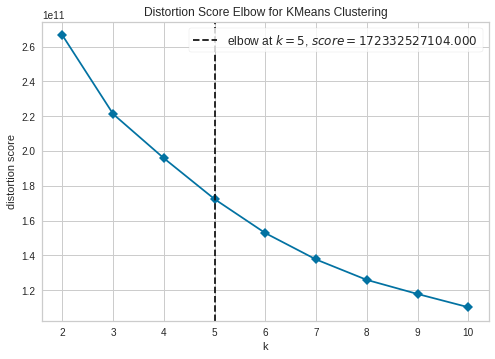

In [18]:
plot_model(model, "elbow")

The elbow method trains the clustering model for a range of K values, and visualizes the distortion score for each one of them¹⁰. The point of inflection on the curve –known as the elbow– is an indication of the optimal value for K. As expected, the plot has an elbow at K = 5, highlighted by the dashed vertical line.

In [60]:
model = create_model("kmeans", num_clusters = 5)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.392,2484.3643,1.2478,0,0,0


In [37]:
#best_model = compare_models()

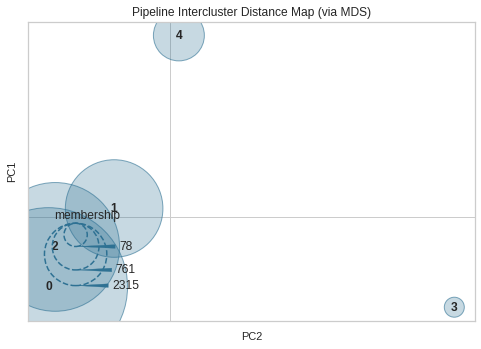

In [64]:
plot_model(model, "distance")

In [66]:
plot_model(model, "tsne")

In [20]:
plot_model(model, "cluster")

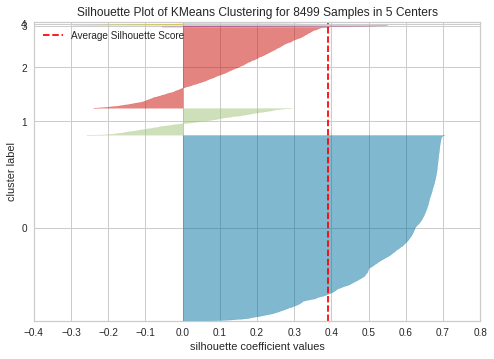

In [24]:
plot_model(model, plot = "silhouette")

In [31]:


plot_model(model, plot = "distribution")

### Min_payments

In [47]:
plot_model(model, plot = "distribution", feature = "min_payments")


In [67]:
plot_model(model, plot = "distribution", feature = "credit_limit")


### Balance_account

In [55]:
plot_model(model, plot = "distribution", feature = "balance_account")
#fig.write_image("images/fig1.pdf")

### Installments

In [51]:
plot_model(model, plot = "distribution", feature = "installments")


### Full Purchases

In [68]:
plot_model(model, plot = "distribution", feature = "nr_purchases")

In [70]:
plot_model(model, plot = "distribution", feature = "cash_advance")

ValueError: ignored

In [49]:
df_clear.columns

Index(['balance_account', 'purchases_amount', 'paid_advance', 'full_purchases',
       'balance_frequency_update', 'installments', 'purchases_frequency',
       'full_purchases_frequency', 'purchases_installments_frequency',
       'cash_advance_frequency', 'nr_cash_advances', 'nr_purchases',
       'credit_limit', 'fixed_rate_period', 'payments', 'min_payments',
       'full_payment_prc'],
      dtype='object')

In [40]:
pip install -U kaleido

     |████████████████████████████████| 79.9 MB 116 kB/s 


In [25]:
models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch
kmodes,K-Modes Clustering,kmodes.kmodes.KModes


### Try dbscan

In [28]:
#dbscan = create_model("dbscan")

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


In [22]:
save_model(model, "clustering_model")

results = assign_model(model)
results.head(10)

Transformation Pipeline and Model Successfully Saved


,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc,Cluster
0,9.298409,107.60,0.000000,0.00,0.909091,107.6,0.909091,0.000000,0.818182,0.000000,0,10,1000.0,11,89.868853,89.711672,0.428571,Cluster 0
1,52.666422,150.30,0.000000,0.00,1.000000,150.3,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,6,54.722514,82.955180,0.000000,Cluster 0
2,1360.795674,0.00,462.861443,0.00,1.000000,0.0,0.000000,0.000000,0.000000,0.272727,6,0,1500.0,11,303.031979,443.781316,0.000000,Cluster 0
3,2021.641161,363.18,0.000000,363.18,1.000000,0.0,1.000000,1.000000,0.000000,0.000000,0,13,2000.0,12,704.240770,795.859808,0.000000,Cluster 0
4,22.322374,95.00,1162.045833,95.00,0.363636,0.0,0.083333,0.083333,0.000000,0.166667,3,1,2500.0,12,4094.261427,40.142262,0.000000,Cluster 0
5,9266.080540,100.00,4383.296268,0.00,1.000000,100.0,0.333333,0.000000,0.250000,0.166667,3,4,17500.0,12,2444.123547,2603.406476,0.000000,Cluster 1
6,97.389327,60.00,0.000000,60.00,1.000000,0.0,0.083333,0.083333,0.000000,0.000000,0,1,12500.0,12,453.421982,204.880010,0.000000,Cluster 2
7,4788.283283,0.00,437.808586,0.00,1.000000,0.0,0.000000,0.000000,0.000000,0.166667,2,0,5000.0,12,823.840717,1934.821741,0.000000,Cluster 2
8,319.037744,1262.28,0.000000,1262.28,0.818182,0.0,0.250000,0.250000,0.000000,0.000000,0,6,10500.0,12,1350.541585,218.810614,0.125000,Cluster 2
9,1641.251218,0.00,2990.165538,0.00,0.727273,0.0,0.000000,0.000000,0.000000,0.166667,4,0,3000.0,12,4399.723425,500.276155,0.142857,Cluster 0


In [109]:
clusters = results[["Cluster"]]
clusters

,Cluster
0,Cluster 0
1,Cluster 0
2,Cluster 0
3,Cluster 0
4,Cluster 0
...,...
8495,Cluster 2
8496,Cluster 0
8497,Cluster 0
8498,Cluster 0


In [111]:
df_c = results.drop("Cluster", axis=1)
df_c

,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc
0,9.298409,107.60,0.000000,0.00,0.909091,107.60,0.909091,0.000000,0.818182,0.000000,0,10,1000.0,11,89.868853,89.711672,0.428571
1,52.666422,150.30,0.000000,0.00,1.000000,150.30,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,6,54.722514,82.955180,0.000000
2,1360.795674,0.00,462.861443,0.00,1.000000,0.00,0.000000,0.000000,0.000000,0.272727,6,0,1500.0,11,303.031979,443.781316,0.000000
3,2021.641161,363.18,0.000000,363.18,1.000000,0.00,1.000000,1.000000,0.000000,0.000000,0,13,2000.0,12,704.240770,795.859808,0.000000
4,22.322374,95.00,1162.045833,95.00,0.363636,0.00,0.083333,0.083333,0.000000,0.166667,3,1,2500.0,12,4094.261427,40.142262,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8495,1127.607606,0.00,271.093275,0.00,1.000000,0.00,0.000000,0.000000,0.000000,0.083333,1,0,8500.0,12,662.387331,260.277533,0.000000
8496,21.409828,149.71,0.000000,0.00,1.000000,149.71,0.916667,0.000000,0.916667,0.000000,0,11,1500.0,12,141.974905,150.500248,0.166667
8497,0.000000,0.00,253.887233,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.111111,1,0,500.0,9,2437.932505,NaN,0.000000
8498,1646.384530,1047.34,146.650389,1047.34,1.000000,0.00,0.583333,0.583333,0.000000,0.166667,2,51,3000.0,12,462.848132,497.408854,0.000000


In [114]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler

imp = KNNImputer()
sc = StandardScaler()

imp.fit(df_c)
imp_df = imp.transform(df_c)

sc.fit(imp_df)
scaled_df = sc.transform(imp_df)


In [115]:
scaled_df

array([[-0.7447335 , -0.41411874, -0.4684104 , ..., -0.56394882,
        -0.32331566,  0.94670801],
       [-0.72398768, -0.39429665, -0.4684104 , ..., -0.57609697,
        -0.32617452, -0.52351507],
       [-0.09822202, -0.46406855, -0.24572257, ..., -0.49027003,
        -0.17349858, -0.52351507],
       ...,
       [-0.74918155, -0.46406855, -0.3462624 , ...,  0.24764779,
        -0.31087469, -0.52351507],
       [ 0.03839422,  0.02212511, -0.39785525, ..., -0.43503037,
        -0.15080722, -0.52351507],
       [ 0.14110094,  0.34926854, -0.4684104 , ..., -0.33994569,
        -0.17633594, -0.52351507]])

In [117]:
x= pd.DataFrame(scaled_df, columns=df_c.columns)
x

,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc
0,-0.744733,-0.414119,-0.468410,-0.352351,0.137896,-0.334190,1.046406,-0.678304,1.144031,-0.673420,-0.474688,-0.187144,-0.960397,-0.386286,-0.563949,-0.323316,0.946708
1,-0.723988,-0.394297,-0.468410,-0.352351,0.520844,-0.287274,1.273089,-0.678304,1.182181,-0.673420,-0.474688,-0.347137,-0.960397,-4.123811,-0.576097,-0.326175,-0.523515
2,-0.098222,-0.464069,-0.245723,-0.352351,0.520844,-0.452415,-1.220429,-0.678304,-0.916142,0.684165,0.400606,-0.587127,-0.822641,-0.386286,-0.490270,-0.173499,-0.523515
3,0.217905,-0.295474,-0.468410,-0.134807,0.520844,-0.452415,1.273089,2.680242,-0.916142,-0.673420,-0.474688,-0.067149,-0.684884,0.361219,-0.351594,-0.024524,-0.523515
4,-0.738503,-0.419968,0.090663,-0.295447,-2.159796,-0.452415,-1.012637,-0.398426,-0.916142,0.156218,-0.037041,-0.547128,-0.547127,0.361219,0.820150,-0.344290,-0.523515
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8494,-0.209771,-0.464069,-0.337984,-0.352351,0.520844,-0.452415,-1.220429,-0.678304,-0.916142,-0.258603,-0.328806,-0.587127,1.105952,0.361219,-0.366061,-0.251144,-0.523515
8495,-0.738940,-0.394571,-0.468410,-0.352351,0.520844,-0.287922,1.065297,-0.678304,1.392015,-0.673420,-0.474688,-0.147145,-0.822641,0.361219,-0.545939,-0.297594,0.048240
8496,-0.749182,-0.464069,-0.346262,-0.352351,-3.691588,-0.452415,-1.220429,-0.678304,-0.916142,-0.120330,-0.328806,-0.587127,-1.098154,-1.881296,0.247648,-0.310875,-0.523515
8497,0.038394,0.022125,-0.397855,0.275003,0.520844,-0.452415,0.234122,1.280847,-0.916142,0.156218,-0.182924,1.452787,-0.409371,0.361219,-0.435030,-0.150807,-0.523515


In [119]:
x.head(5)

,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc
0,-0.744733,-0.414119,-0.468410,-0.352351,0.137896,-0.334190,1.046406,-0.678304,1.144031,-0.673420,-0.474688,-0.187144,-0.960397,-0.386286,-0.563949,-0.323316,0.946708
1,-0.723988,-0.394297,-0.468410,-0.352351,0.520844,-0.287274,1.273089,-0.678304,1.182181,-0.673420,-0.474688,-0.347137,-0.960397,-4.123811,-0.576097,-0.326175,-0.523515
2,-0.098222,-0.464069,-0.245723,-0.352351,0.520844,-0.452415,-1.220429,-0.678304,-0.916142,0.684165,0.400606,-0.587127,-0.822641,-0.386286,-0.490270,-0.173499,-0.523515
3,0.217905,-0.295474,-0.468410,-0.134807,0.520844,-0.452415,1.273089,2.680242,-0.916142,-0.673420,-0.474688,-0.067149,-0.684884,0.361219,-0.351594,-0.024524,-0.523515
4,-0.738503,-0.419968,0.090663,-0.295447,-2.159796,-0.452415,-1.012637,-0.398426,-0.916142,0.156218,-0.037041,-0.547128,-0.547127,0.361219,0.820150,-0.344290,-0.523515


In [120]:
clusters.head(5)

,Cluster
0,Cluster 0
1,Cluster 0
2,Cluster 0
3,Cluster 0
4,Cluster 0


In [122]:
merged_df = pd.concat([x,clusters], axis=1)
merged_df

,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc,Cluster
0,-0.744733,-0.414119,-0.468410,-0.352351,0.137896,-0.334190,1.046406,-0.678304,1.144031,-0.673420,-0.474688,-0.187144,-0.960397,-0.386286,-0.563949,-0.323316,0.946708,Cluster 0
1,-0.723988,-0.394297,-0.468410,-0.352351,0.520844,-0.287274,1.273089,-0.678304,1.182181,-0.673420,-0.474688,-0.347137,-0.960397,-4.123811,-0.576097,-0.326175,-0.523515,Cluster 0
2,-0.098222,-0.464069,-0.245723,-0.352351,0.520844,-0.452415,-1.220429,-0.678304,-0.916142,0.684165,0.400606,-0.587127,-0.822641,-0.386286,-0.490270,-0.173499,-0.523515,Cluster 0
3,0.217905,-0.295474,-0.468410,-0.134807,0.520844,-0.452415,1.273089,2.680242,-0.916142,-0.673420,-0.474688,-0.067149,-0.684884,0.361219,-0.351594,-0.024524,-0.523515,Cluster 0
4,-0.738503,-0.419968,0.090663,-0.295447,-2.159796,-0.452415,-1.012637,-0.398426,-0.916142,0.156218,-0.037041,-0.547128,-0.547127,0.361219,0.820150,-0.344290,-0.523515,Cluster 0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8495,-0.738940,-0.394571,-0.468410,-0.352351,0.520844,-0.287922,1.065297,-0.678304,1.392015,-0.673420,-0.474688,-0.147145,-0.822641,0.361219,-0.545939,-0.297594,0.048240,Cluster 2
8496,-0.749182,-0.464069,-0.346262,-0.352351,-3.691588,-0.452415,-1.220429,-0.678304,-0.916142,-0.120330,-0.328806,-0.587127,-1.098154,-1.881296,0.247648,-0.310875,-0.523515,Cluster 0
8497,0.038394,0.022125,-0.397855,0.275003,0.520844,-0.452415,0.234122,1.280847,-0.916142,0.156218,-0.182924,1.452787,-0.409371,0.361219,-0.435030,-0.150807,-0.523515,Cluster 0
8498,0.141101,0.349269,-0.468410,0.496537,0.520844,-0.084468,1.065297,1.280847,0.762518,-0.673420,-0.474688,0.692819,-0.271614,0.361219,-0.339946,-0.176336,-0.523515,Cluster 0


In [75]:
cluster0 = results[results["Cluster"] == "Cluster 0"]
cluster0

,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc,Cluster
0,9.298409,107.60,0.000000,0.00,0.909091,107.60,0.909091,0.000000,0.818182,0.000000,0,10,1000.0,11,89.868853,89.711672,0.428571,Cluster 0
1,52.666422,150.30,0.000000,0.00,1.000000,150.30,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,6,54.722514,82.955180,0.000000,Cluster 0
2,1360.795674,0.00,462.861443,0.00,1.000000,0.00,0.000000,0.000000,0.000000,0.272727,6,0,1500.0,11,303.031979,443.781316,0.000000,Cluster 0
3,2021.641161,363.18,0.000000,363.18,1.000000,0.00,1.000000,1.000000,0.000000,0.000000,0,13,2000.0,12,704.240770,795.859808,0.000000,Cluster 0
4,22.322374,95.00,1162.045833,95.00,0.363636,0.00,0.083333,0.083333,0.000000,0.166667,3,1,2500.0,12,4094.261427,40.142262,0.000000,Cluster 0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8491,1748.310383,0.00,157.152652,0.00,1.000000,0.00,0.000000,0.000000,0.000000,0.083333,1,0,2000.0,12,538.443435,484.325120,0.000000,Cluster 0
8496,21.409828,149.71,0.000000,0.00,1.000000,149.71,0.916667,0.000000,0.916667,0.000000,0,11,1500.0,12,141.974905,150.500248,0.166667,Cluster 0
8497,0.000000,0.00,253.887233,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.111111,1,0,500.0,9,2437.932505,NaN,0.000000,Cluster 0
8498,1646.384530,1047.34,146.650389,1047.34,1.000000,0.00,0.583333,0.583333,0.000000,0.166667,2,51,3000.0,12,462.848132,497.408854,0.000000,Cluster 0


In [ ]:
cluster0

In [84]:
#cluster0.describe()

In [123]:
pd.set_option('display.max_rows', 150)

merged_df.groupby("Cluster").describe().T

Cluster                                   Cluster 0  ...  Cluster 4
balance_account                  count  5308.000000  ...  78.000000
                                 mean     -0.342560  ...   1.420487
                                 std       0.456741  ...   1.955955
                                 min      -0.749182  ...  -0.747085
                                 25%      -0.714328  ...  -0.036441
                                 50%      -0.479955  ...   0.688348
                                 75%      -0.118932  ...   2.370564
                                 max       5.218315  ...   8.360424
purchases_amount                 count  5308.000000  ...  78.000000
                                 mean     -0.220667  ...   6.379585
                                 std       0.364509  ...   4.847531
                                 min      -0.464069  ...  -0.464069
                                 25%      -0.462165  ...   4.062292
                                 50%      -0.346854  ...   5.199240
                                 75%      -0.143736  ...   9.496810
                                 max       9.167212  ...  22.300963
paid_advance                     count  5308.000000  ...  78.000000
                                 mean     -0.215988  ...   1.190761
                                 std       0.466152  ...   3.896524
                                 min      -0.468410  ...  -0.468410
                                 25%      -0.468410  ...  -0.468410
                                 50%      -0.468410  ...  -0.468410
                                 75%      -0.127354  ...   0.466538
                                 max       4.327395  ...  22.209830
full_purchases                   count  5308.000000  ...  78.000000
                                 mean     -0.197588  ...   5.991662
                                 std       0.341077  ...   5.747868
                                 min      -0.352351  ...  -0.352351
                                 25%      -0.352351  ...   1.404771
                                 50%      -0.352351  ...   5.256123
                                 75%      -0.198595  ...   8.103702
                                 max       7.438861  ...  24.063565
balance_frequency_update         count  5308.000000  ...  78.000000
                                 mean     -0.106144  ...   0.206139
                                 std       1.083298  ...   0.825188
                                 min      -3.691588  ...  -3.308640
                                 25%      -0.245052  ...   0.520844
                                 50%       0.520844  ...   0.520844
                                 75%       0.520844  ...   0.520844
                                 max       0.520844  ...   0.520844
installments                     count  5308.000000  ...  78.000000
                                 mean     -0.159867  ...   4.109104
                                 std       0.499544  ...   5.108966
                                 min      -0.452415  ...  -0.452415
                                 25%      -0.452415  ...   0.118629
                                 50%      -0.377959  ...   2.749837
                                 75%      -0.055802  ...   5.565048
                                 max       8.052148  ...  24.269288
purchases_frequency              count  5308.000000  ...  78.000000
                                 mean     -0.093915  ...   0.866415
                                 std       0.982293  ...   0.749744
                                 min      -1.220429  ...  -1.220429
                                 25%      -1.012637  ...   0.899061
                                 50%      -0.181462  ...   1.273089
                                 75%       0.996032  ...   1.273089
                                 max       1.273089  ...   1.273089
full_purchases_frequency         count  5308.000000  ...  78.000000
                                 mean     -0.227197  ...

In [96]:
"""cluster0.hist(figsize = (80,80))

plt.show()"""

'cluster0.hist(figsize = (80,80))\n\nplt.show()'

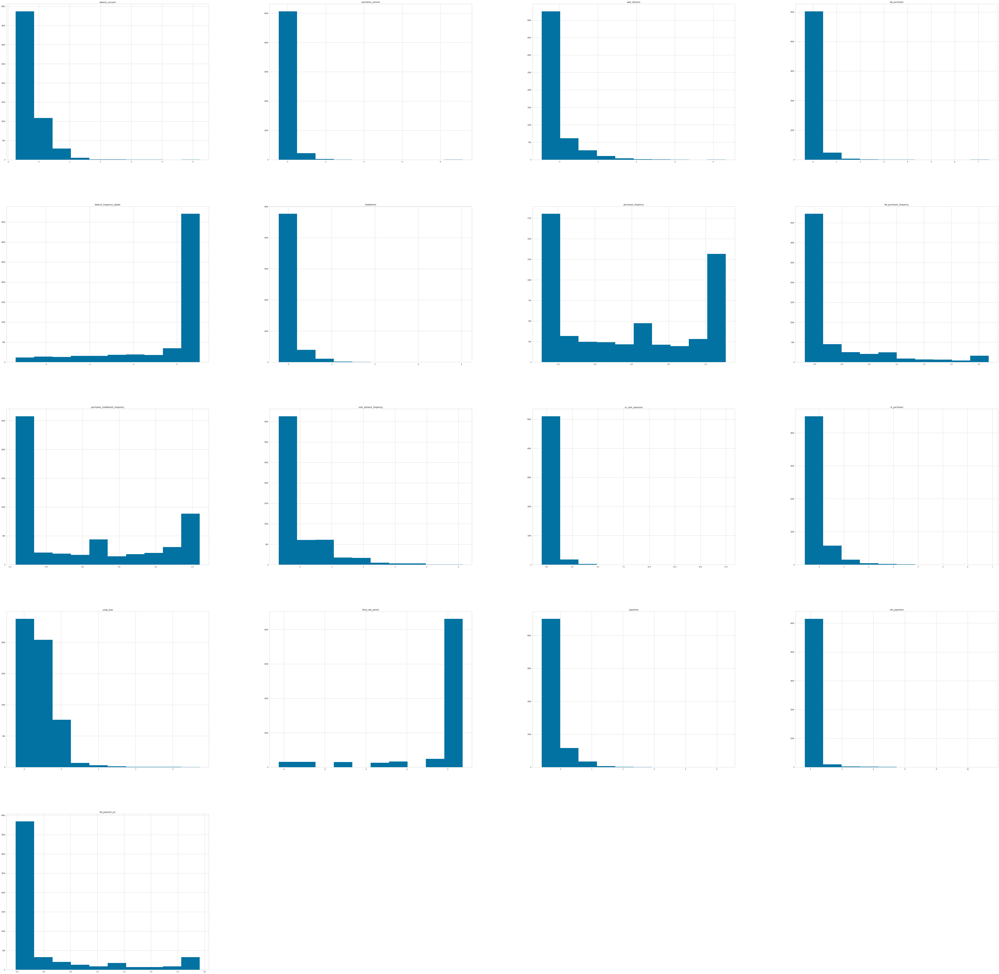

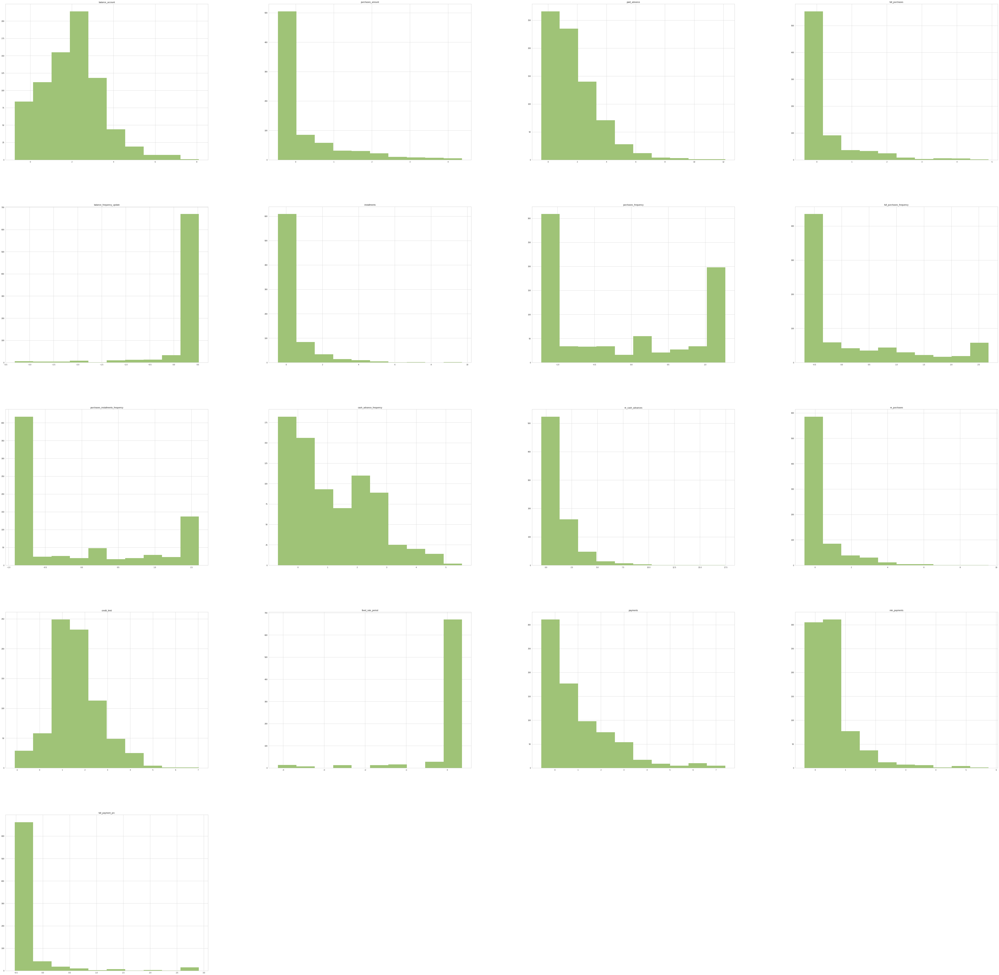

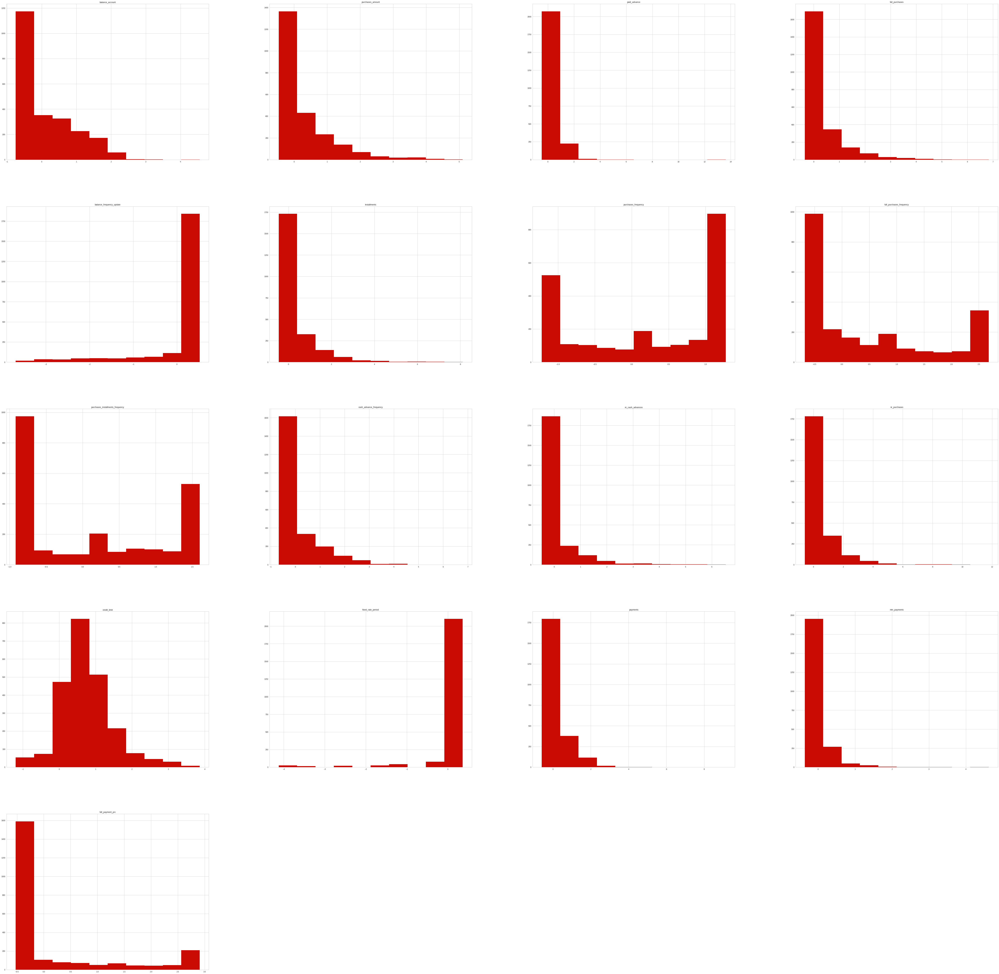

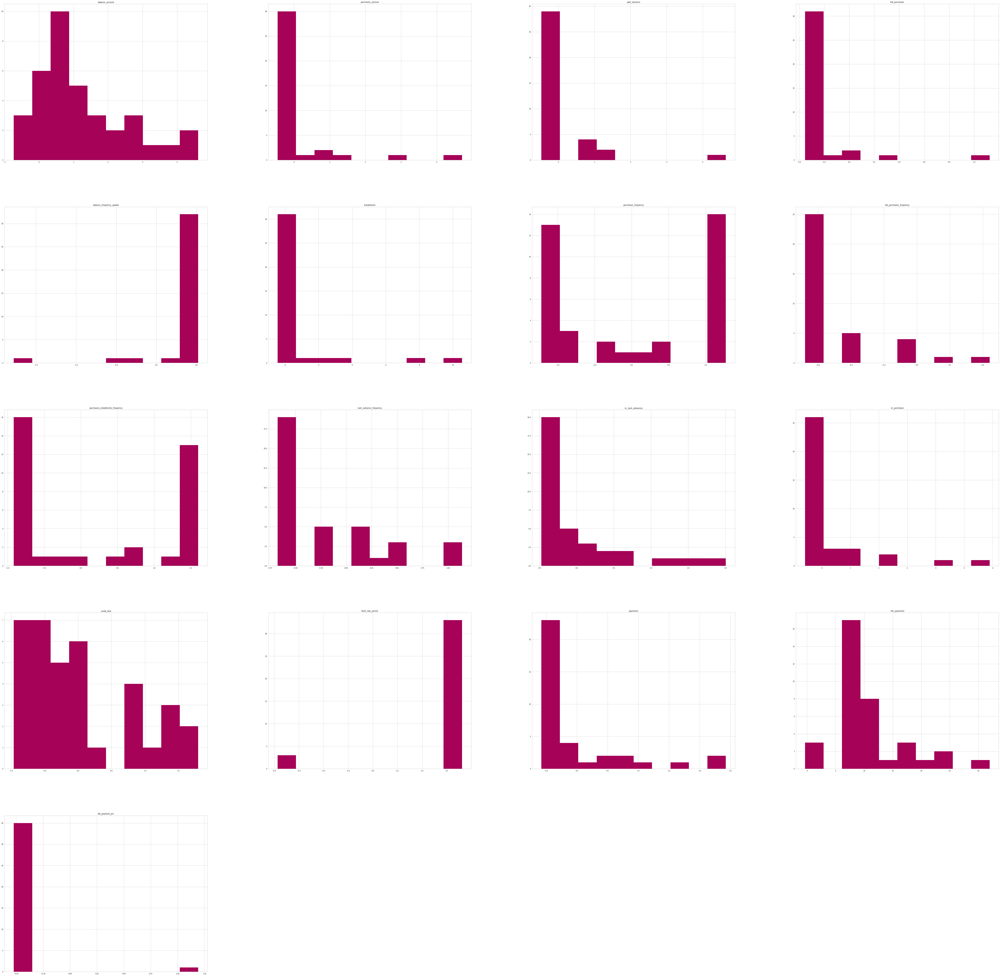

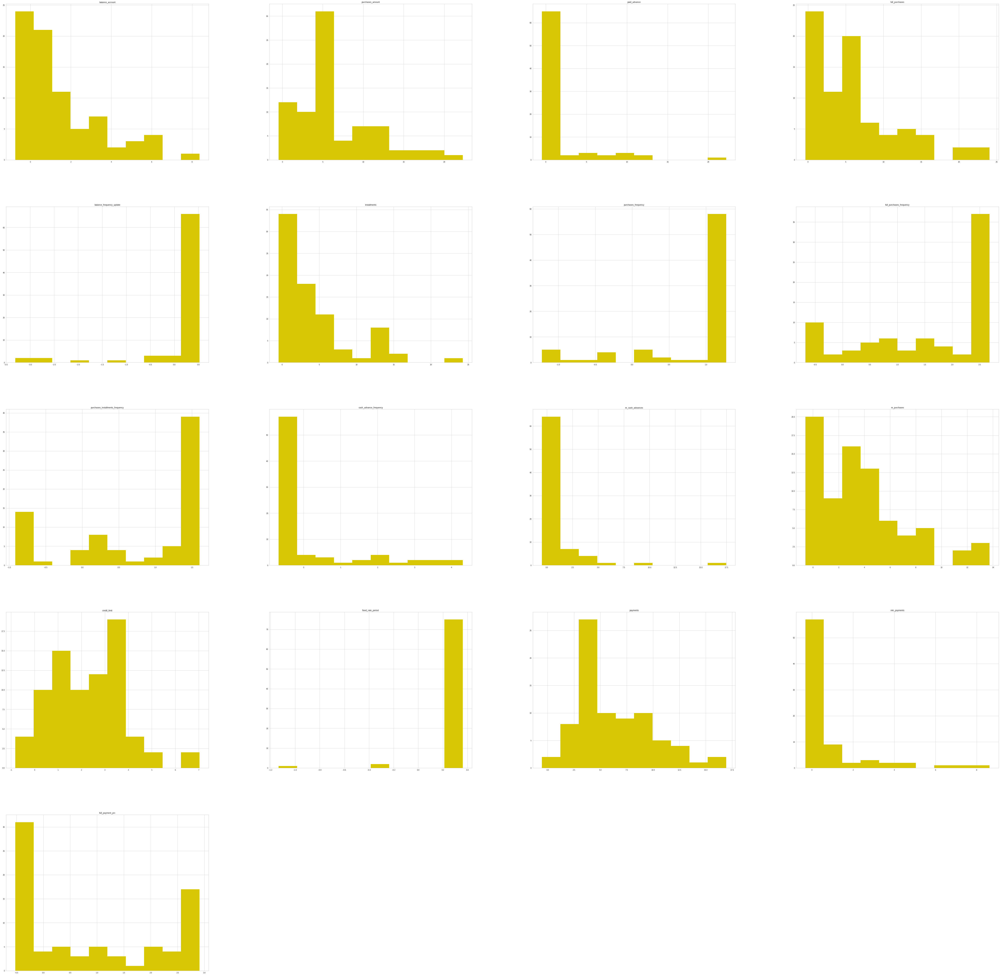

In [124]:
colors = sns.color_palette()

for i, (cluster,df) in enumerate(merged_df.groupby("Cluster")):
   df.hist(figsize = (100,100), color=colors[i])
   plt

plt.show()

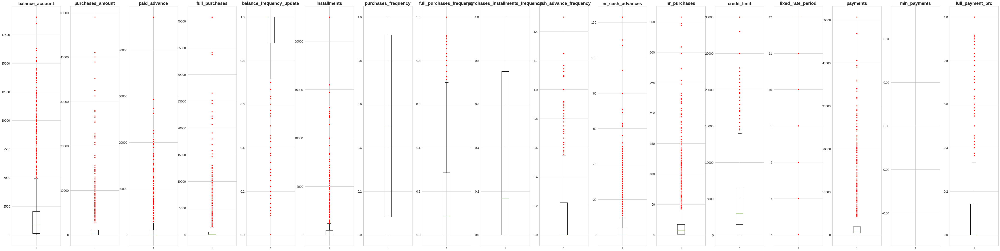

In [90]:
red_circle = dict(markerfacecolor='red', marker='o', markeredgecolor='white')

fig, axs = plt.subplots(1, len(df_clear.columns), figsize=(80,20))

for i, ax in enumerate(axs.flat):
    ax.boxplot(df_clear.iloc[:,i], flierprops=red_circle)
    ax.set_title(df_clear.columns[i], fontsize=20, fontweight='bold')
    ax.tick_params(axis='y', labelsize=14)
    
#plt.tight_layout()

In [78]:
fig = go.Figure()
fig.add_trace(go.Box(
    y=cluster0,
    name="All Points",
    jitter=0.3,
    pointpos=-1.8,
    boxpoints='all', # represent all points
    marker_color='rgb(7,40,89)',
    line_color='rgb(7,40,89)'
))

fig.add_trace(go.Box(
    y=cluster0,
    name="Only Whiskers",
    boxpoints=False, # no data points
    marker_color='rgb(9,56,125)',
    line_color='rgb(9,56,125)'
))

fig.add_trace(go.Box(
    y=cluster0,
    name="Suspected Outliers",
    boxpoints='suspectedoutliers', # only suspected outliers
    marker=dict(
        color='rgb(8,81,156)',
        outliercolor='rgba(219, 64, 82, 0.6)',
        line=dict(
            outliercolor='rgba(219, 64, 82, 0.6)',
            outlierwidth=2)),
    line_color='rgb(8,81,156)'
))

fig.add_trace(go.Box(
    y=cluster0,
    name="Whiskers and Outliers",
    boxpoints='outliers', # only outliers
    marker_color='rgb(107,174,214)',
    line_color='rgb(107,174,214)'
))


fig.update_layout(title_text="Outliers", template = "plotly_white")
fig.show()

## Categorical vs. Numerical Data??

In [ ]:
categorical_features = df.iloc[:, list(np.where(df.dtypes == "int")[0])].columns
continious_features = df.iloc[:, list(np.where(df.dtypes == "float")[0])].columns
categorical_features, continious_features

(Index(['nr_cash_advances', 'nr_purchases', 'fixed_rate_period'], dtype='object'),
 Index(['balance_account', 'purchases_amount', 'paid_advance', 'full_purchases',
        'balance_frequency_update', 'installments', 'purchases_frequency',
        'full_purchases_frequency', 'purchases_installments_frequency',
        'cash_advance_frequency', 'credit_limit', 'payments', 'min_payments',
        'full_payment_prc'],
       dtype='object'))

<a id='P2' name="P2"></a>
## [Part 2 Meaningful Questions](#P0)

In [29]:
results

,balance_account,purchases_amount,paid_advance,full_purchases,balance_frequency_update,installments,purchases_frequency,full_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,nr_cash_advances,nr_purchases,credit_limit,fixed_rate_period,payments,min_payments,full_payment_prc,Cluster
0,9.298409,107.60,0.000000,0.00,0.909091,107.60,0.909091,0.000000,0.818182,0.000000,0,10,1000.0,11,89.868853,89.711672,0.428571,Cluster 0
1,52.666422,150.30,0.000000,0.00,1.000000,150.30,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,6,54.722514,82.955180,0.000000,Cluster 0
2,1360.795674,0.00,462.861443,0.00,1.000000,0.00,0.000000,0.000000,0.000000,0.272727,6,0,1500.0,11,303.031979,443.781316,0.000000,Cluster 0
3,2021.641161,363.18,0.000000,363.18,1.000000,0.00,1.000000,1.000000,0.000000,0.000000,0,13,2000.0,12,704.240770,795.859808,0.000000,Cluster 0
4,22.322374,95.00,1162.045833,95.00,0.363636,0.00,0.083333,0.083333,0.000000,0.166667,3,1,2500.0,12,4094.261427,40.142262,0.000000,Cluster 0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8495,1127.607606,0.00,271.093275,0.00,1.000000,0.00,0.000000,0.000000,0.000000,0.083333,1,0,8500.0,12,662.387331,260.277533,0.000000,Cluster 2
8496,21.409828,149.71,0.000000,0.00,1.000000,149.71,0.916667,0.000000,0.916667,0.000000,0,11,1500.0,12,141.974905,150.500248,0.166667,Cluster 0
8497,0.000000,0.00,253.887233,0.00,0.000000,0.00,0.000000,0.000000,0.000000,0.111111,1,0,500.0,9,2437.932505,NaN,0.000000,Cluster 0
8498,1646.384530,1047.34,146.650389,1047.34,1.000000,0.00,0.583333,0.583333,0.000000,0.166667,2,51,3000.0,12,462.848132,497.408854,0.000000,Cluster 0


<a id='P3' name="P3"></a>
## [Part 3 title here](#P0)

<a id='CL'></a>
## [Conclusion](#P0)

This is a pre-written conclusion in which we have nice figures.

<div style="border-top:0.1cm solid #EF475B"></div>
    <strong><a href='#Q0'><div style="text-align: right"> <h3>End of this Notebook.</h3></div></a></strong>